In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.preprocessing import StandardScaler

In [ ]:
%matplotlib inline

In [37]:
def load_and_clean_data(file_path):
    """
    Load a single CSV file and perform initial cleaning
    """
    df = pd.read_csv(file_path)
    df['timestamp'] = pd.to_datetime(df['timestamp'])
    # Handle duplicate timestamps by taking the mean value
    df = df.groupby('timestamp')['value'].mean().reset_index()
    return df

In [30]:
# List of CSV files
csv_files = [
    'ec2_cpu_utilization_5f5533.csv', 'ec2_cpu_utilization_24ae8d.csv', 
    'ec2_cpu_utilization_53ea38.csv', 'ec2_cpu_utilization_77c1ca.csv', 
    'ec2_cpu_utilization_825cc2.csv', 'ec2_cpu_utilization_ac20cd.csv', 
    'ec2_cpu_utilization_c6585a.csv', 'ec2_cpu_utilization_fe7f93.csv', 
    'ec2_disk_write_bytes_1ef3de.csv', 'ec2_disk_write_bytes_c0d644.csv', 
    'ec2_network_in_5abac7.csv', 'ec2_network_in_257a54.csv', 
    'elb_request_count_8c0756.csv', 'grok_asg_anomaly.csv', 
    'iio_us-east-1_i-a2eb1cd9_NetworkIn.csv', 'rds_cpu_utilization_cc0c53.csv', 
    'rds_cpu_utilization_e47b3b.csv'
]

In [31]:
# Load all CSV files
dataframes = {}

In [32]:
for file in csv_files:
    metric_name = file.split('.')[0]
    dataframes[metric_name] = load_and_clean_data(file)

In [33]:
print(f"Loaded {len(dataframes)} datasets")

Loaded 17 datasets


In [38]:
# Combine all dataframes into a single dataframe
combined_df = pd.DataFrame()

for key, df in dataframes.items():
    df = df.set_index('timestamp')
    df = df.rename(columns={'value': key})
    if combined_df.empty:
        combined_df = df
    else:
        combined_df = combined_df.join(df, how='outer')

combined_df.columns.name = 'metric'

In [39]:
# Check for missing values
print("\nMissing values:\n", combined_df.isna().sum())


Missing values:
 metric
ec2_cpu_utilization_5f5533            33712
ec2_cpu_utilization_24ae8d            33712
ec2_cpu_utilization_53ea38            33712
ec2_cpu_utilization_77c1ca            33712
ec2_cpu_utilization_825cc2            33712
ec2_cpu_utilization_ac20cd            33712
ec2_cpu_utilization_c6585a            33712
ec2_cpu_utilization_fe7f93            33712
ec2_disk_write_bytes_1ef3de           32882
ec2_disk_write_bytes_c0d644           33712
ec2_network_in_5abac7                 32882
ec2_network_in_257a54                 33712
elb_request_count_8c0756              33712
grok_asg_anomaly                      33123
iio_us-east-1_i-a2eb1cd9_NetworkIn    36501
rds_cpu_utilization_cc0c53            33712
rds_cpu_utilization_e47b3b            33712
dtype: int64


In [40]:
# Handle missing values (if any)
combined_df = combined_df.fillna(method='ffill').fillna(method='bfill')

C:\Users\_Sidheshwar__\AppData\Local\Temp\ipykernel_3204\1746610151.py:2: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  combined_df = combined_df.fillna(method='ffill').fillna(method='bfill')


In [46]:
def remove_outliers(df):
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outlier_mask = ((df < lower_bound) | (df > upper_bound)).any(axis=1)
    
    print(f"Number of outliers removed: {outlier_mask.sum()}")
    
    return df[~outlier_mask]


In [47]:
combined_df = remove_outliers(combined_df)

Number of outliers removed: 28982


In [48]:
# Resample data to ensure consistent time intervals (e.g., 5-minute intervals)
combined_df = combined_df.resample('5T').mean()

print("\nDataset shape after preprocessing:", combined_df.shape)


Dataset shape after preprocessing: (13536, 17)


C:\Users\_Sidheshwar__\AppData\Local\Temp\ipykernel_3204\3211956060.py:2: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  combined_df = combined_df.resample('5T').mean()


#### 1.2 Exploratory Data Analysis (EDA)

C:\Users\_Sidheshwar__\AppData\Local\Temp\ipykernel_3204\3261960572.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  for i, (metric, data) in enumerate(combined_df.groupby(level=0, axis=1)):


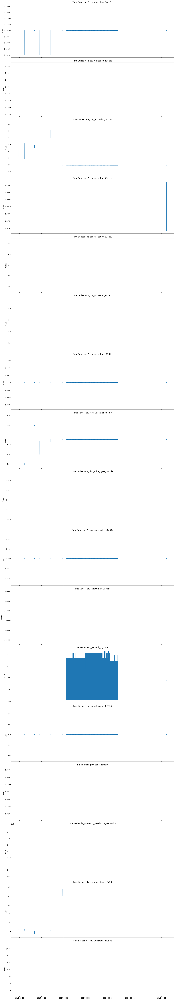

In [49]:
# Visualize time series for each metric
fig, axes = plt.subplots(len(dataframes), 1, figsize=(15, 5*len(dataframes)), sharex=True)
for i, (metric, data) in enumerate(combined_df.groupby(level=0, axis=1)):
    axes[i].plot(data)
    axes[i].set_title(f'Time Series: {metric}')
    axes[i].set_ylabel('Value')
plt.tight_layout()
plt.show()

In [50]:
# Compute basic statistics
print("\nBasic Statistics:")
print(combined_df.describe())


Basic Statistics:
metric  ec2_cpu_utilization_5f5533  ec2_cpu_utilization_24ae8d  \
count                  4393.000000                 4393.000000   
mean                     38.015374                    0.133978   
std                       1.441625                    0.000271   
min                      35.774000                    0.132000   
25%                      37.718000                    0.134000   
50%                      37.718000                    0.134000   
75%                      37.718000                    0.134000   
max                      50.185000                    0.136000   

metric  ec2_cpu_utilization_53ea38  ec2_cpu_utilization_77c1ca  \
count                 4.393000e+03                 4393.000000   
mean                  1.766000e+00                    0.068015   
std                   2.220699e-16                    0.000704   
min                   1.766000e+00                    0.068000   
25%                   1.766000e+00                    0.

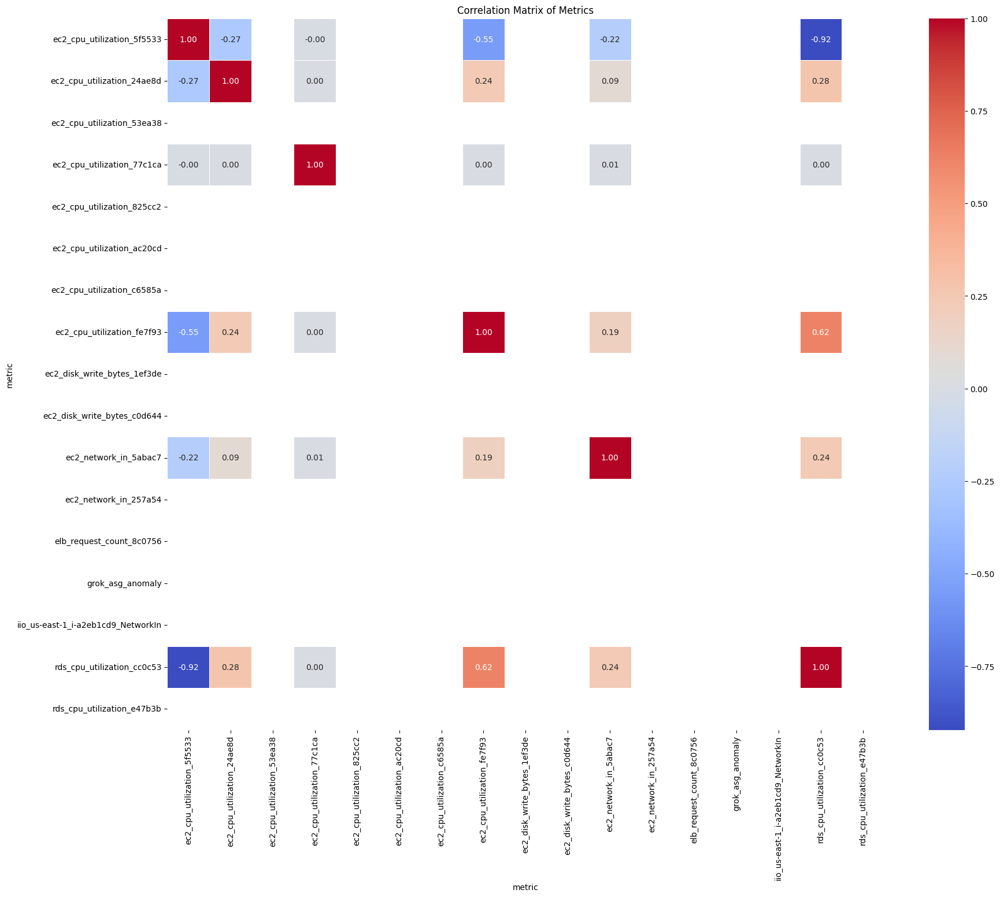

In [51]:
# Analyze correlations between different metrics
correlation_matrix = combined_df.corr()
plt.figure(figsize=(20, 16))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f')
plt.title('Correlation Matrix of Metrics')
plt.show()

In [64]:
# Diagnostic code to understand DataFrame structure
print(combined_df.columns)
print(combined_df.head())

Index(['ec2_cpu_utilization_5f5533', 'ec2_cpu_utilization_24ae8d',
       'ec2_cpu_utilization_53ea38', 'ec2_cpu_utilization_77c1ca',
       'ec2_cpu_utilization_825cc2', 'ec2_cpu_utilization_ac20cd',
       'ec2_cpu_utilization_c6585a', 'ec2_cpu_utilization_fe7f93',
       'ec2_disk_write_bytes_1ef3de', 'ec2_disk_write_bytes_c0d644',
       'ec2_network_in_5abac7', 'ec2_network_in_257a54',
       'elb_request_count_8c0756', 'grok_asg_anomaly',
       'iio_us-east-1_i-a2eb1cd9_NetworkIn', 'rds_cpu_utilization_cc0c53',
       'rds_cpu_utilization_e47b3b'],
      dtype='object', name='metric')
metric               ec2_cpu_utilization_5f5533  ec2_cpu_utilization_24ae8d  \
timestamp                                                                     
2014-02-14 15:00:00                      44.789                       0.134   
2014-02-14 15:05:00                      40.470                       0.134   
2014-02-14 15:10:00                         NaN                         NaN   
2014-0

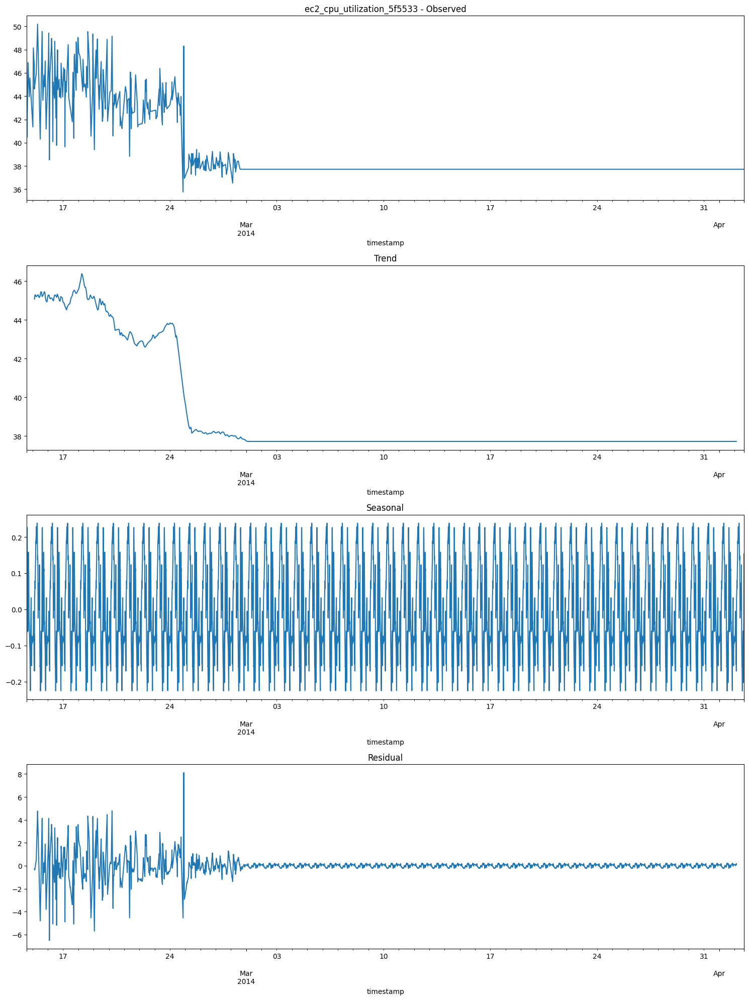

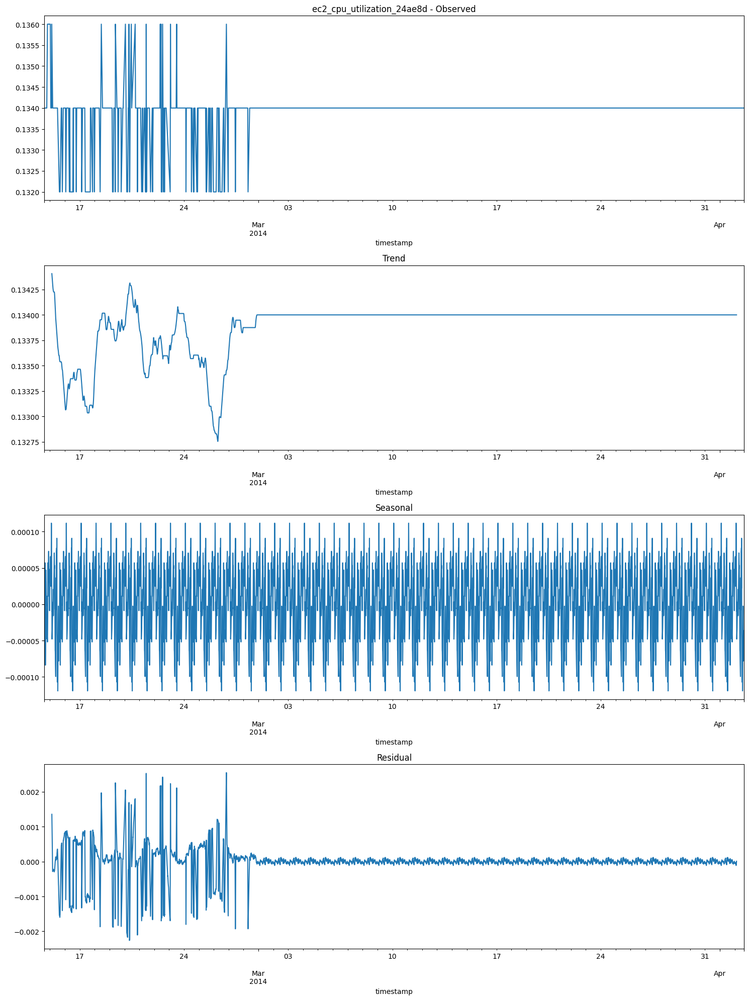

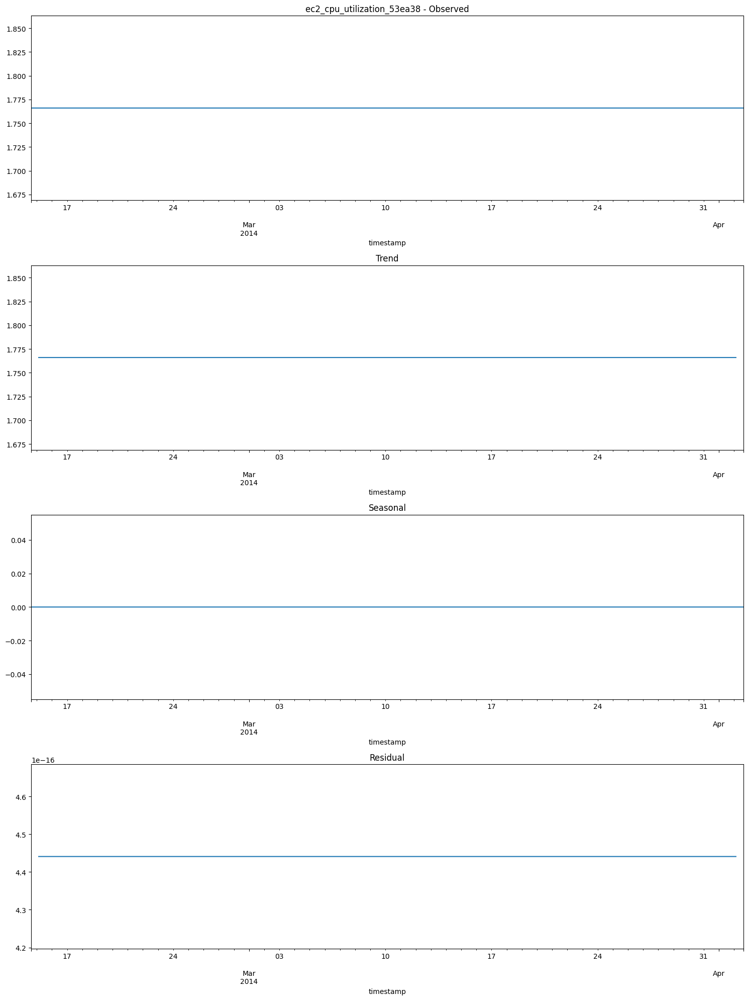

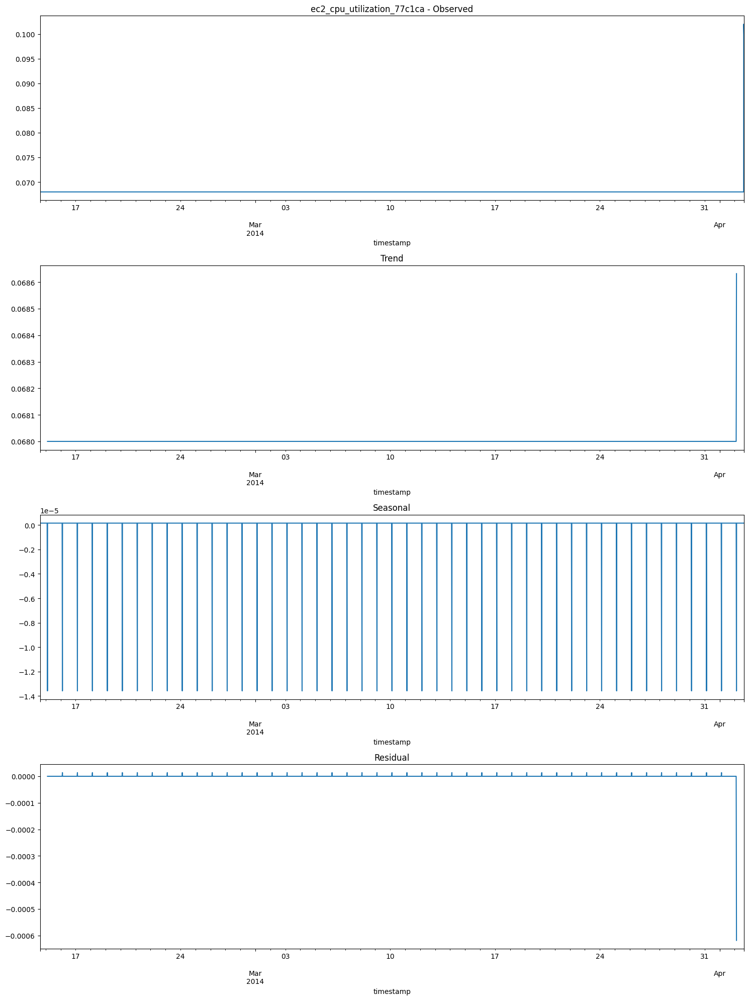

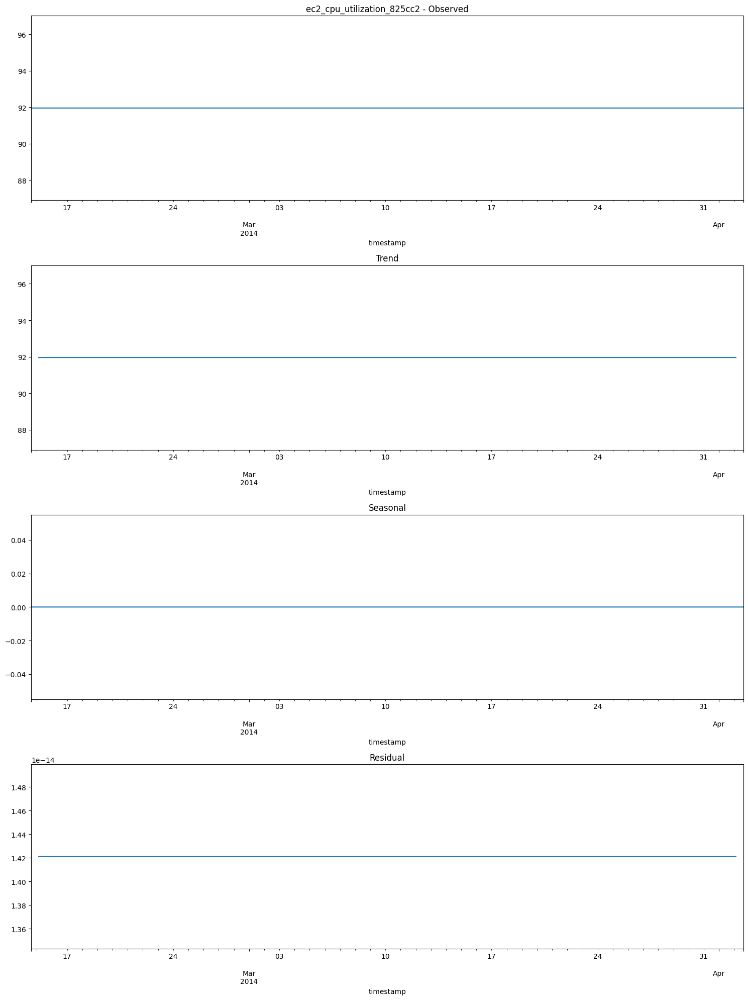

...

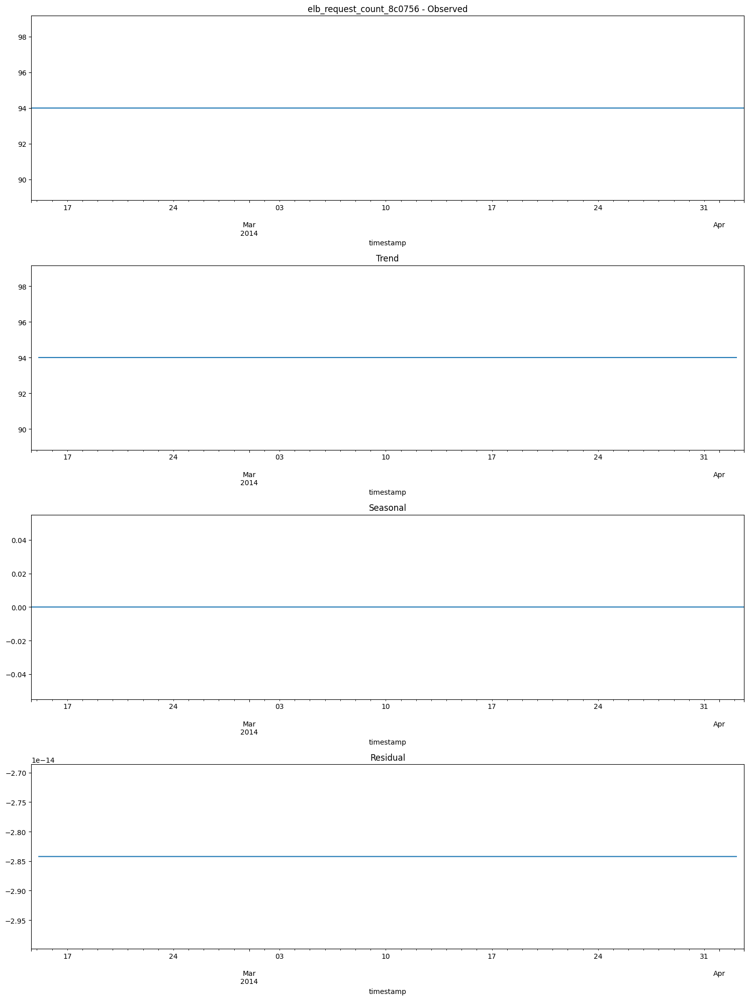

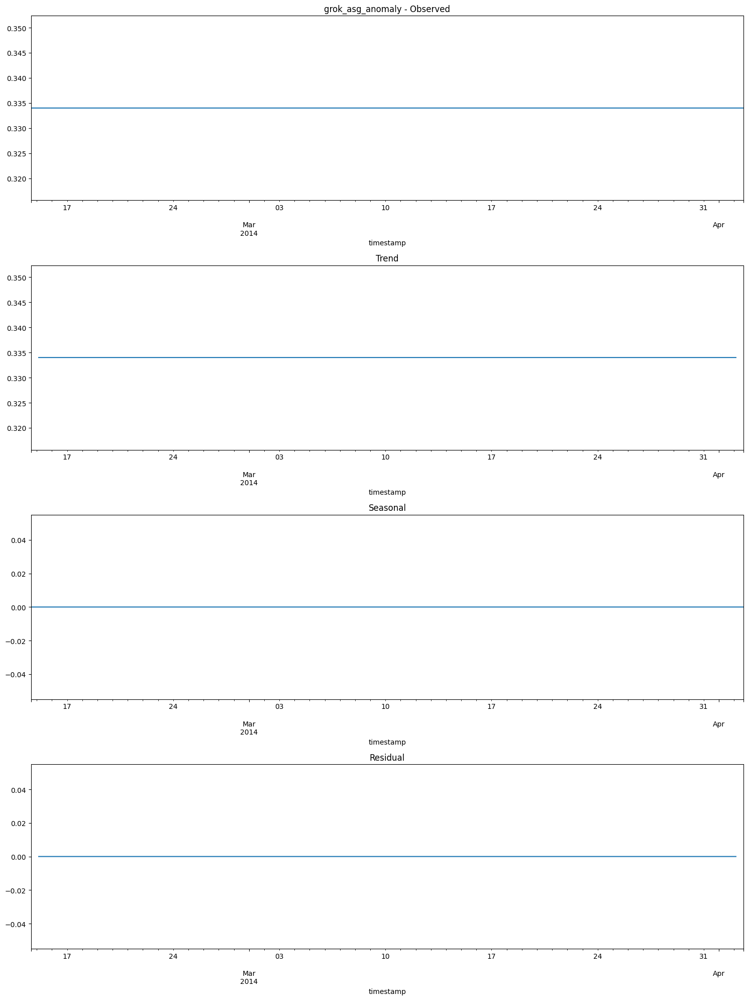

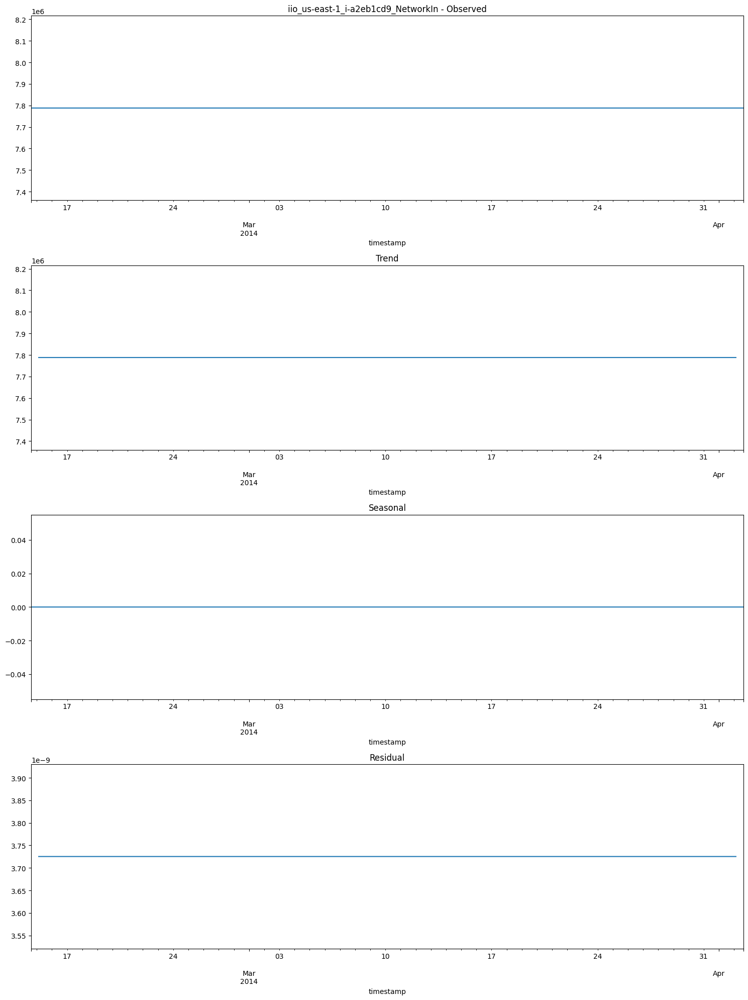

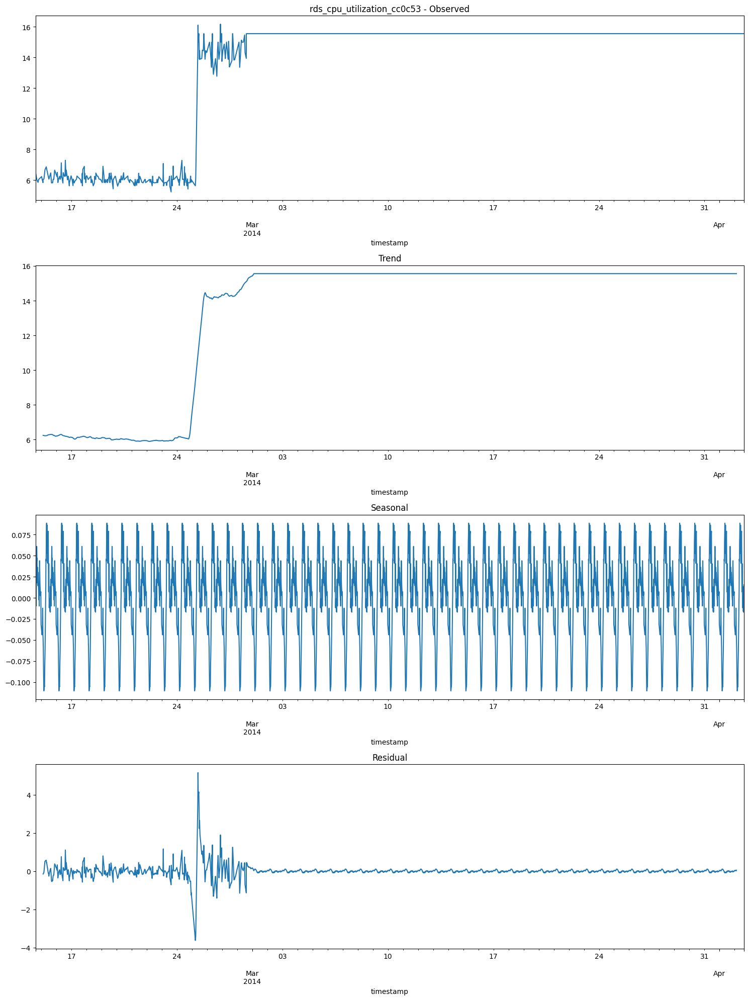

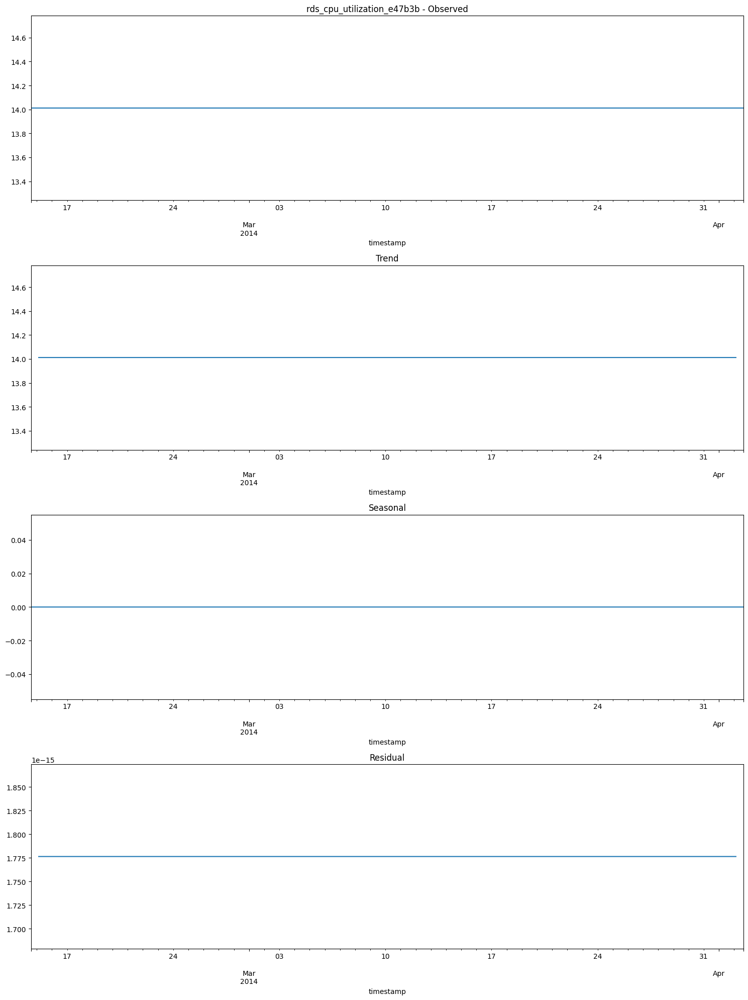

In [68]:
def plot_seasonal_decompose(df, metric):
    # Check if 'metric' is in the column names
    if metric not in df.columns:
        print(f"Error: '{metric}' not found in DataFrame columns.")
        return
    
    # If the column is a series, use it directly; if it's a DataFrame, use the first column
    series = df[metric] if isinstance(df[metric], pd.Series) else df[metric].iloc[:, 0]
    
    # Handle missing values by interpolation
    series_interpolated = series.interpolate()
    
    # Perform seasonal decomposition
    result = seasonal_decompose(series_interpolated, model='additive', period=288)  # 288 for daily seasonality (5-min intervals)
    
    # Create the plot
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(15, 20))
    result.observed.plot(ax=ax1)
    ax1.set_title(f'{metric} - Observed')
    result.trend.plot(ax=ax2)
    ax2.set_title('Trend')
    result.seasonal.plot(ax=ax3)
    ax3.set_title('Seasonal')
    result.resid.plot(ax=ax4)
    ax4.set_title('Residual')
    plt.tight_layout()
    plt.show()

# Example usage
for metric in combined_df.columns:
    plot_seasonal_decompose(combined_df, metric)


#### 1.3 Feature Engineering

In [90]:
# Create lag features specifically for week (7 days) and month (30 days)
def create_week_month_lag_features(df):
    # Create lag for 7 days (weekly) and 30 days (monthly)
    weekly_lag = 7
    monthly_lag = 30
    for col in df.columns:
        df[f'{col}_lag_week'] = df[col].shift(weekly_lag)
        df[f'{col}_lag_month'] = df[col].shift(monthly_lag)
    return df

# Apply the lag feature creation
combined_df_with_week_month_lags = create_week_month_lag_features(combined_df.copy())

C:\Users\_Sidheshwar__\AppData\Local\Temp\ipykernel_3204\3418819272.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'{col}_lag_week'] = df[col].shift(weekly_lag)
C:\Users\_Sidheshwar__\AppData\Local\Temp\ipykernel_3204\3418819272.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'{col}_lag_month'] = df[col].shift(monthly_lag)
C:\Users\_Sidheshwar__\AppData\Local\Temp\ipykernel_3204\3418819272.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, 

KeyboardInterrupt: 

In [92]:
df

,rds_cpu_utilization_e47b3b
timestamp,
2014-04-10 00:02:00,14.0120
2014-04-10 00:07:00,13.3340
2014-04-10 00:12:00,15.0000
2014-04-10 00:17:00,13.9980
2014-04-10 00:22:00,14.3320
...,...
2014-04-23 23:37:00,17.0900
2014-04-23 23:42:00,17.0800
2014-04-23 23:47:00,17.0825


In [98]:
# Extract time-based features from the index
def extract_basic_time_features(df):
    df['day_of_week'] = df.index.dayofweek
    df['day_of_month'] = df.index.day
    df['month'] = df.index.month
    return df

# Apply the function to extract time-based features
combined_df_with_basic_features = extract_basic_time_features(combined_df.copy())


In [99]:
combined_df_with_basic_features

metric,ec2_cpu_utilization_5f5533,ec2_cpu_utilization_24ae8d,ec2_cpu_utilization_53ea38,ec2_cpu_utilization_77c1ca,ec2_cpu_utilization_825cc2,ec2_cpu_utilization_ac20cd,ec2_cpu_utilization_c6585a,ec2_cpu_utilization_fe7f93,ec2_disk_write_bytes_1ef3de,ec2_disk_write_bytes_c0d644,...,ec2_cpu_utilization_fe7f93_lag_12_lag_12_lag_1_rolling_std_48,ec2_cpu_utilization_fe7f93_lag_12_lag_12_lag_6_rolling_mean_24,ec2_cpu_utilization_fe7f93_lag_12_lag_12_lag_6_rolling_std_24,ec2_cpu_utilization_fe7f93_lag_12_lag_12_lag_6_rolling_mean_48,ec2_cpu_utilization_fe7f93_lag_12_lag_12_lag_6_rolling_std_48,ec2_cpu_utilization_fe7f93_lag_12_lag_12_lag_12_rolling_mean_24,ec2_cpu_utilization_fe7f93_lag_12_lag_12_lag_12_rolling_std_24,ec2_cpu_utilization_fe7f93_lag_12_lag_12_lag_12_rolling_mean_48,ec2_cpu_utilization_fe7f93_lag_12_lag_12_lag_12_rolling_std_48,day_of_month
timestamp,,,,,,,,,,,,,,,,,,,,,
2014-02-14 15:00:00,44.789,0.134,1.766,0.068,91.958,42.652,0.066,2.309,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14
2014-02-14 15:05:00,40.470,0.134,1.766,0.068,91.958,42.652,0.066,2.252,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14
2014-02-14 15:10:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14
2014-02-14 15:15:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14
2014-02-14 15:20:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-04-02 14:35:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
2014-04-02 14:40:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
2014-04-02 14:45:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2


## 2. Anomaly Detection Model

In [102]:
# Check for missing values in the DataFrame
print(combined_df_with_basic_features.isna().sum())


metric
ec2_cpu_utilization_5f5533                                          9143
ec2_cpu_utilization_24ae8d                                          9143
ec2_cpu_utilization_53ea38                                          9143
ec2_cpu_utilization_77c1ca                                          9143
ec2_cpu_utilization_825cc2                                          9143
                                                                   ...  
ec2_cpu_utilization_fe7f93_lag_12_lag_12_lag_12_rolling_mean_24    11701
ec2_cpu_utilization_fe7f93_lag_12_lag_12_lag_12_rolling_std_24     11701
ec2_cpu_utilization_fe7f93_lag_12_lag_12_lag_12_rolling_mean_48    12510
ec2_cpu_utilization_fe7f93_lag_12_lag_12_lag_12_rolling_std_48     12510
day_of_month                                                           0
Length: 51773, dtype: int64


In [103]:
# Fill NaN values with the mean of each column
combined_df_with_basic_features = combined_df_with_basic_features.fillna(combined_df_with_basic_features.mean())

### 1. Isolation Forest Implementation


In [101]:
from sklearn.ensemble import IsolationForest

# Initialize the Isolation Forest model
iso_forest = IsolationForest(contamination=0.01, random_state=42)

# Train the Isolation Forest on the dataset (use the DataFrame without worrying about 'timestamp' since it's in the index)
iso_forest.fit(combined_df_with_basic_features)

# Predict anomalies (output -1 for anomaly, 1 for normal)
iso_forest_predictions = iso_forest.predict(combined_df_with_basic_features)

# Add predictions to the DataFrame
combined_df_with_basic_features['iso_forest_anomaly'] = iso_forest_predictions


ValueError: Input X contains NaN.
IsolationForest does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values